<a href="https://colab.research.google.com/github/pranabIITM/CS6910/blob/main/AS2/P-A/Part_A_Q4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Q4 Apply best model on the test data

Test data path = /content/drive/MyDrive/DL_DATA_iNat/val


In [1]:
import os
import math
import numpy as np
import matplotlib.pyplot as plt
import keras
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
import matplotlib.gridspec as gridspec
from PIL import Image
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [2]:
#mount drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
myBestModel = keras.models.load_model('drive/MyDrive/DL_DATA_iNat/model-best-41.h5')

In [4]:
myBestModel.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 227, 227, 32)      896       
                                                                 
 batch_normalization (BatchN  (None, 227, 227, 32)     128       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 227, 227, 32)      0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 113, 113, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 113, 113, 64)      18496     
                                                                 
 batch_normalization_1 (Batc  (None, 113, 113, 64)     2

### Q4 - (a) -Use the best model and report the accuracy on the test set. 

In [6]:
BATCH_SIZE = 32
test_datagen = ImageDataGenerator(rescale=1./255)
test_data = test_datagen.flow_from_directory(
  '/content/drive/MyDrive/DL_DATA_iNat/val',
  target_size=(227,227),
  batch_size=BATCH_SIZE,
  class_mode='categorical')

Found 2009 images belonging to 10 classes.


In [29]:
myBestModel.evaluate(test_data,steps= test_data.n/test_data.batch_size)

62/62 [==============================] - 119s 2s/step - loss: 1.7723 - accuracy: 0.4092


[1.7723110914230347, 0.4091587960720062]

for best model on test data:
{Loss: **1.7723**} and {Accuracy: **0.4092**}

###Q4 - (b) - 10 x 3 grid containing sample images from the test data and predictions made by best model

In [6]:
#Get all the classes from the folder (folder name is val but it is testing data, validation data was obtained by spliting the train data)
classes=[]
for fold_name in np.sort(os.listdir('/content/drive/MyDrive/DL_DATA_iNat/val')):
  classes.append(fold_name)
print(classes)

['Amphibia', 'Animalia', 'Arachnida', 'Aves', 'Fungi', 'Insecta', 'Mammalia', 'Mollusca', 'Plantae', 'Reptilia']


In [7]:
samp_imgs = []
test_path = '/content/drive/MyDrive/DL_DATA_iNat/val/'
labels = []
# -- total 30 images and 10 classes..
# -- Taking 3 random images from each class..
for i in range(10):
    files = os.listdir(test_path+classes[i])
    indices = np.random.choice(range(len(files)),3)
    for j in range(3):
        pic = Image.open(test_path+classes[i]+'/'+files[indices[j]])
        pic = pic.resize((227,227))
        samp_imgs.append(np.asarray(pic)*1./255)
        labels.append(i)
samp_imgs = np.array(samp_imgs)

In [8]:
prediction = np.argmax(myBestModel.predict(samp_imgs),axis=1)

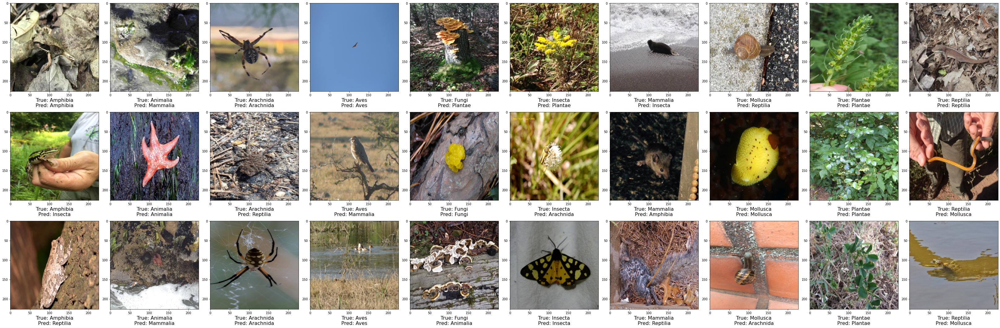

In [9]:
fig,ax = plt.subplots(3,10,figsize=(45,15))
for i in range(10): 
    for j in range(3): 
        img = samp_imgs[(i*3)+j] 
        ax[j,i].imshow(img) 
        ax[j,i].set_xlabel( "True: " + classes[i] +"\n" + "Pred: " + classes[prediction[(i*3)+j]],fontsize=16)
fig.tight_layout()
plt.savefig('/content/drive/MyDrive/DL_DATA_iNat/q4-b.png')

In [10]:
correct = 0
for i in range(10): 
    for j in range(3): 
        if(classes[i]==classes[prediction[(i*3)+j]]):
          correct += 1

print("Accuracy on random sample = {} %".format((correct/30)*100))

Accuracy on random sample = 43.333333333333336 %


### Q4 - (c) - Visualise all the filters in the first layer of best model for a random image from the test set 

In [41]:
#Getting the layer-1 ------------------------------------------------------------
layer = myBestModel.get_layer(name='conv2d')
visualize = keras.Model(inputs=myBestModel.inputs, outputs=layer.output)
feature_maps = visualize(samp_imgs)
print(feature_maps.shape)

(30, 227, 227, 32)


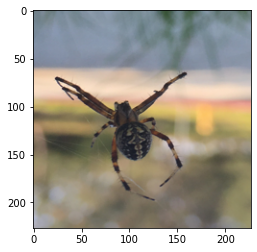

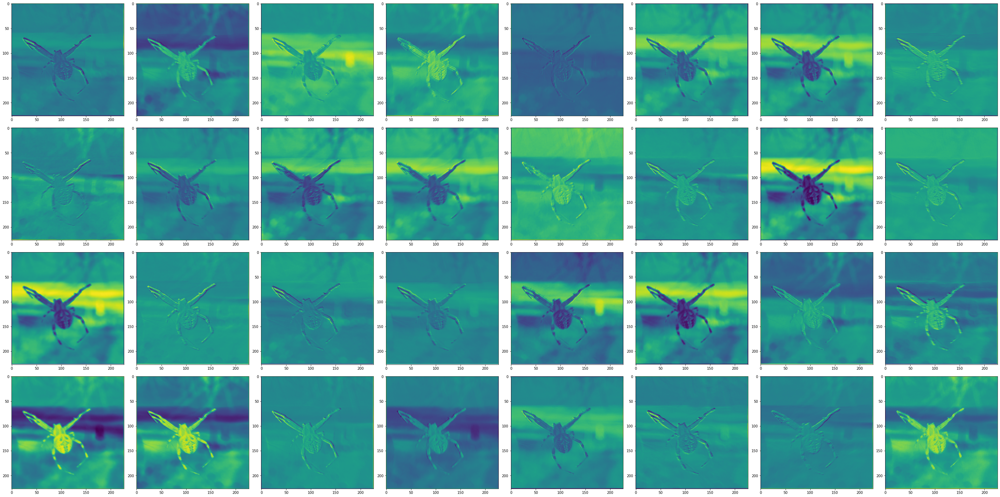

In [42]:
#plotting the feature map of 6th index -----------------------------------------

img_index = 6         #7th image of sample_imgs

plt.imshow(samp_imgs[img_index])
plt.savefig('q4-c-0.png')

fig,ax = plt.subplots(4,8,figsize=(40,20))
for i in range(4):
	for j in range(8):
		ax[i,j].imshow(feature_maps[img_index, :, :, (i*8)+j])
fig.tight_layout()
plt.savefig('/content/drive/MyDrive/DL_DATA_iNat/q4-c-1.png')